In [1]:
!git checkout craft-update 

M	craft_manywell.ipynb
Already on 'craft-update'
Your branch is up to date with 'origin/craft-update'.


In [2]:
from annealed_flow_transport.train import run_experiment
import numpy as np
import jax.numpy as jnp
import jax
import matplotlib.pyplot as plt
from annealed_flow_transport.many_well_plotting import plot, plot_marginal_pair
from annealed_flow_transport.densities import ManyWell
from annealed_flow_transport.resampling import log_effective_sample_size

import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 100

/homes/lim24/miniconda3/envs/jax/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-03-01 13:25:07.021079: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-03-01 13:25:07.021256: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-03-01 13:25:07.021272: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned ab

In [3]:
original_setup = True # whether to run Alex's original config, or a config that is more similar to FAB's setup.
if original_setup:
    from configs.many_well_original import get_config
    exp_config = get_config()
    exp_config.n_samples_plotting = 100
else:
    from configs.many_well import get_config
    exp_config = get_config()
    exp_config.craft_num_iters = 1000
    exp_config.report_step = 100

In [4]:
n_mill_target_eval = exp_config.craft_batch_size*exp_config.craft_num_iters*exp_config.num_temps*exp_config.mcmc_config.hmc_num_leapfrog_steps/1e6
n_mill_target_eval

44.0

  0%|                                                   | 0/200 [00:00<?, ?it/s]

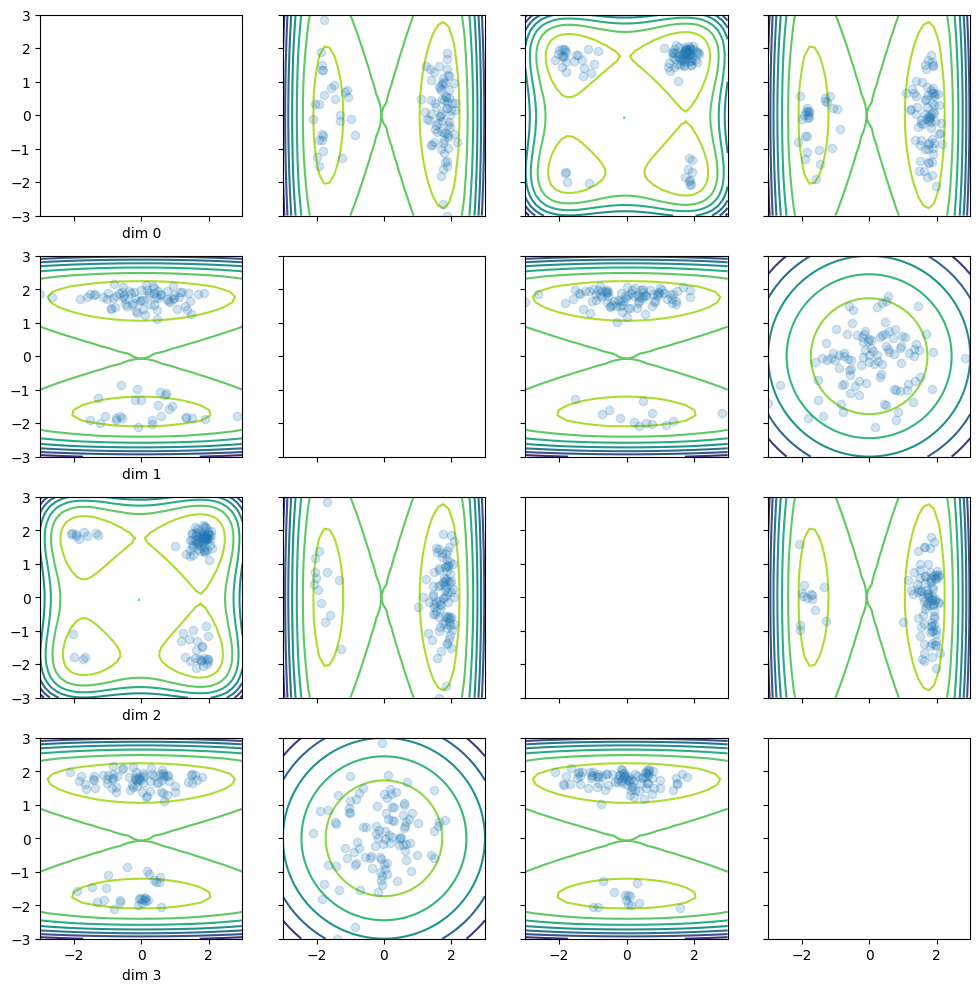

  0%|▏                                          | 1/200 [00:15<52:02, 15.69s/it]

effective sample size of 0.300076425075531
Step 0: Free energy -156.95748901367188 Log Normalizer estimate 162.58963012695312


 16%|██████▉                                   | 33/200 [00:21<00:28,  5.88it/s]

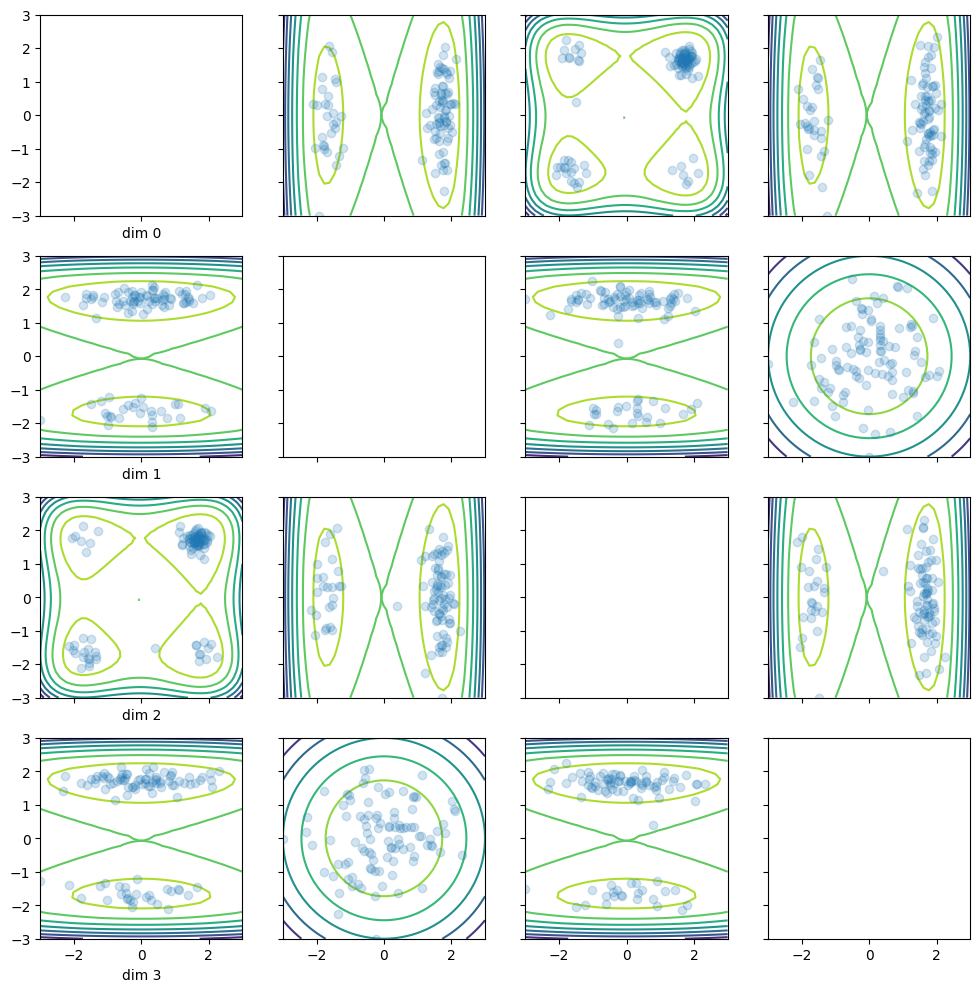

 17%|███████▏                                  | 34/200 [00:33<10:20,  3.74s/it]

effective sample size of 0.3112015128135681
Step 33: Free energy -161.6710205078125 Log Normalizer estimate 164.80555725097656


 33%|█████████████▊                            | 66/200 [00:38<00:22,  5.87it/s]

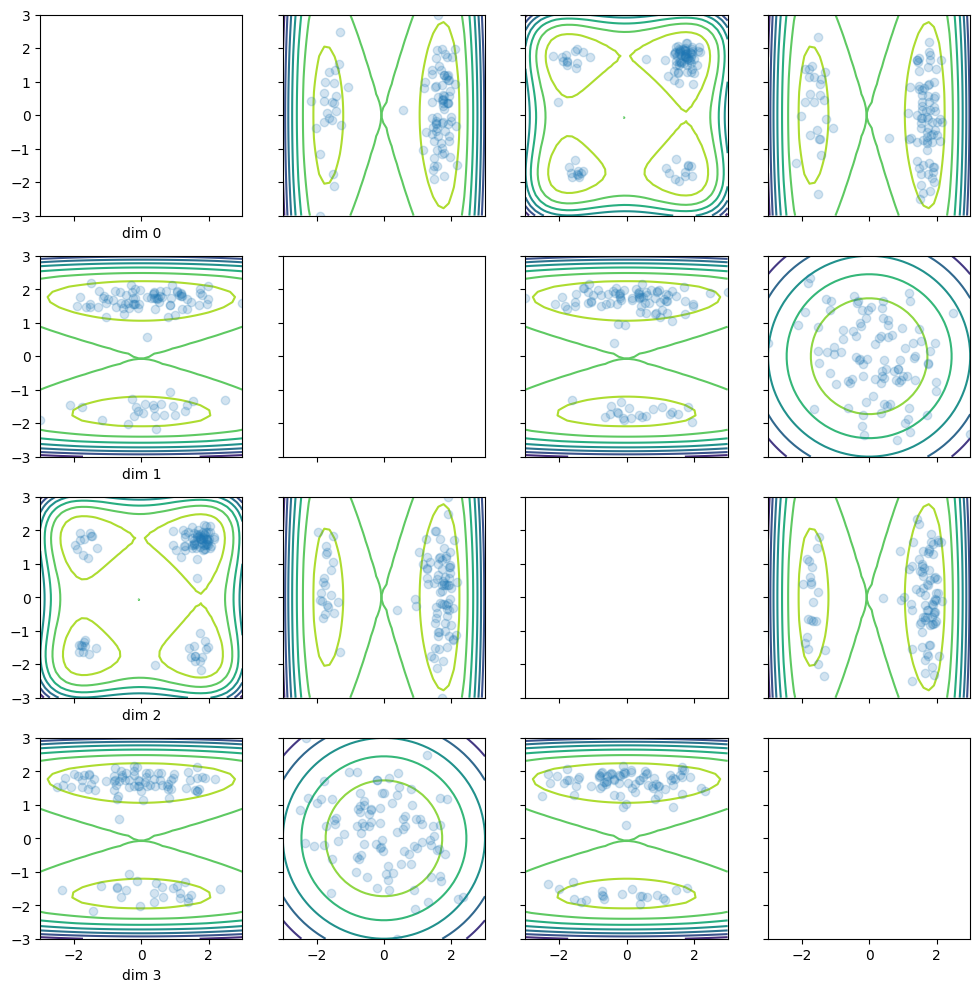

 34%|██████████████                            | 67/200 [00:50<08:14,  3.72s/it]

effective sample size of 0.4671197235584259
Step 66: Free energy -162.65768432617188 Log Normalizer estimate 164.718505859375


 50%|████████████████████▊                     | 99/200 [00:56<00:17,  5.81it/s]

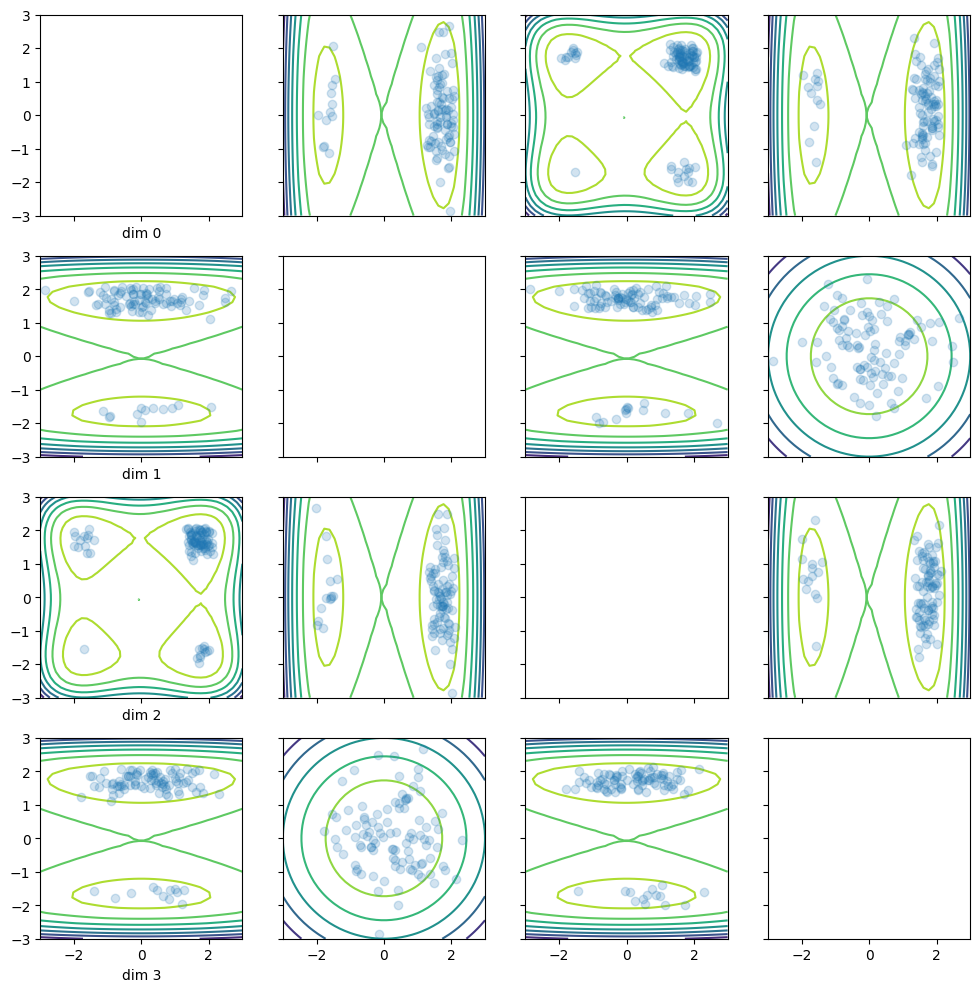

 50%|████████████████████▌                    | 100/200 [01:08<06:09,  3.70s/it]

effective sample size of 0.9999998807907104
Step 99: Free energy -163.22628784179688 Log Normalizer estimate 164.84640502929688


 66%|███████████████████████████              | 132/200 [01:13<00:11,  5.88it/s]

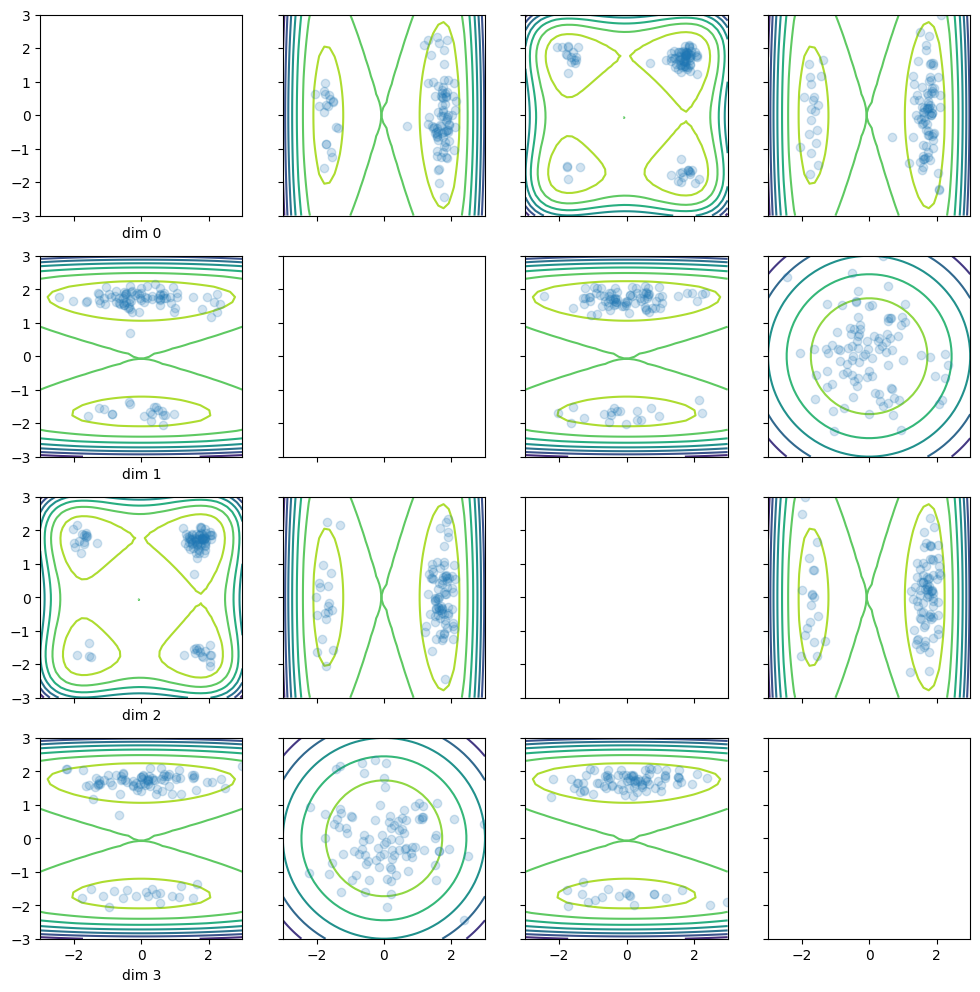

 66%|███████████████████████████▎             | 133/200 [01:25<04:08,  3.70s/it]

effective sample size of 0.5222919583320618
Step 132: Free energy -163.2555389404297 Log Normalizer estimate 164.58477783203125


 82%|█████████████████████████████████▊       | 165/200 [01:31<00:05,  5.86it/s]

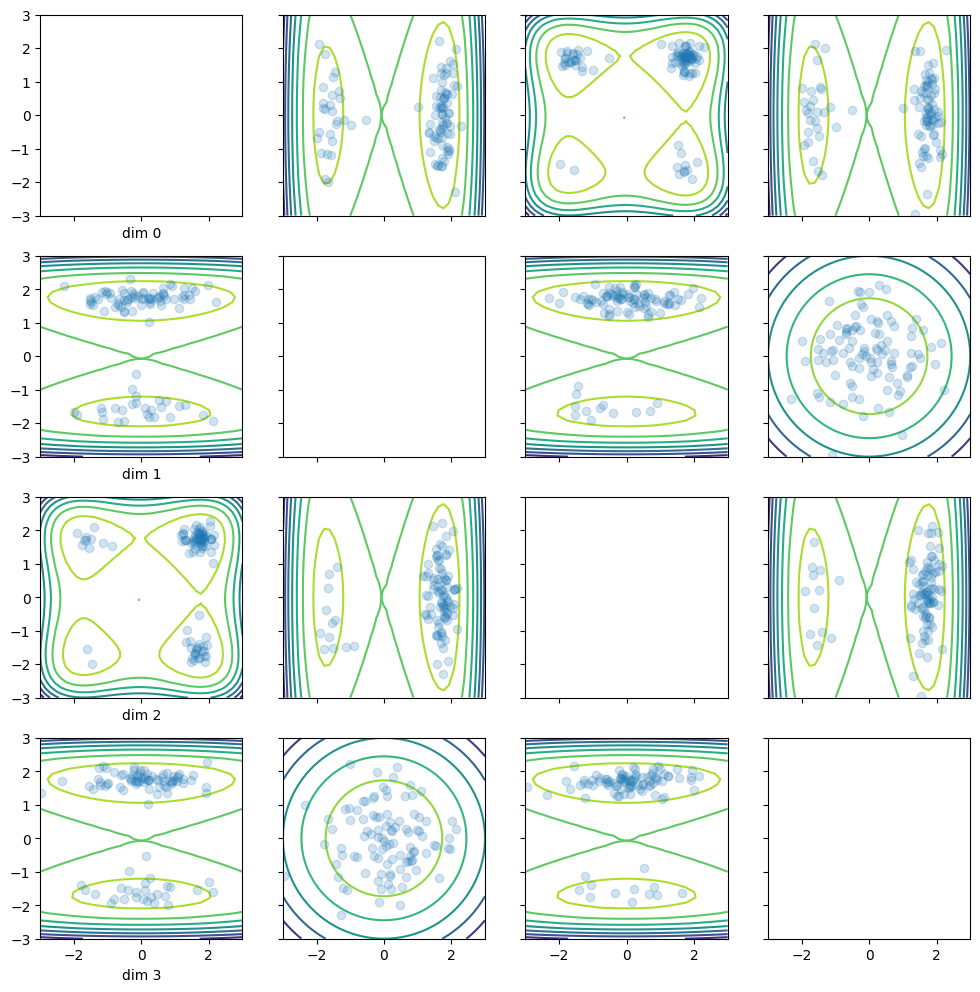

 83%|██████████████████████████████████       | 166/200 [01:43<02:05,  3.68s/it]

effective sample size of 0.9209058284759521
Step 165: Free energy -163.44459533691406 Log Normalizer estimate 164.64920043945312


 99%|████████████████████████████████████████▌| 198/200 [01:48<00:00,  5.87it/s]

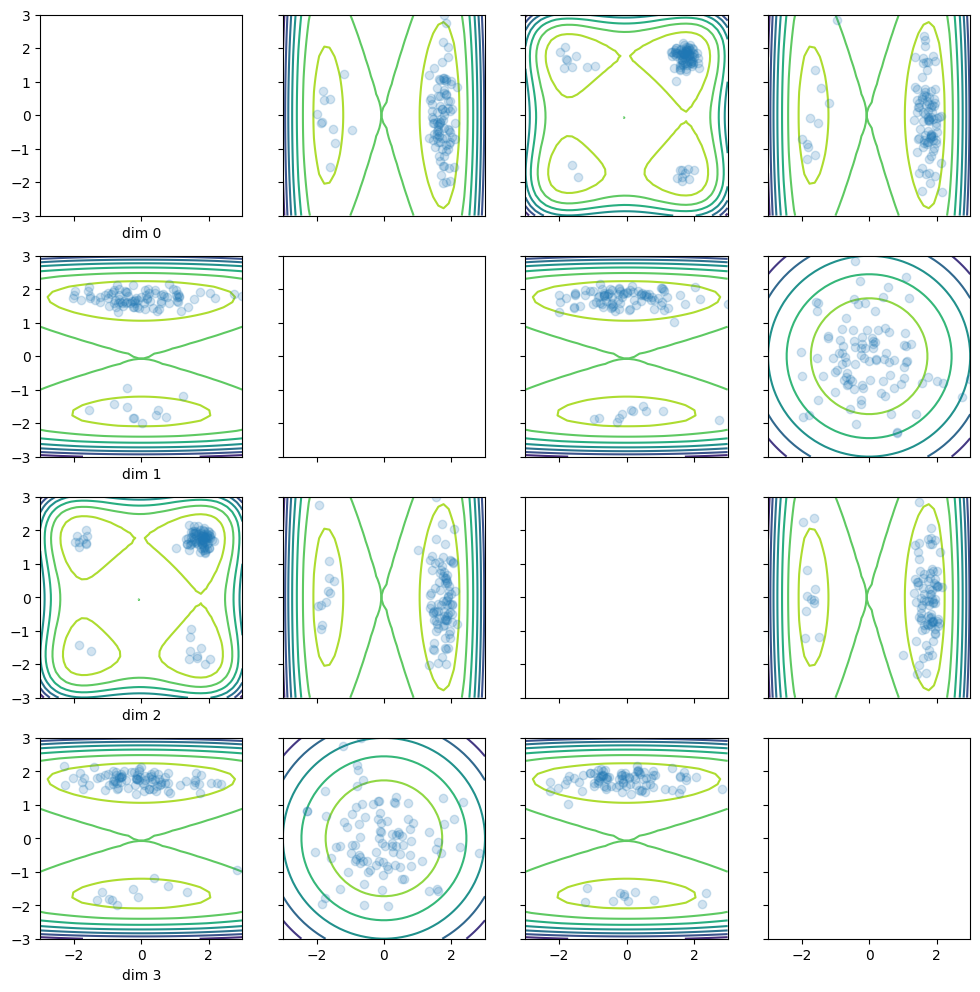

100%|████████████████████████████████████████▊| 199/200 [02:00<00:03,  3.76s/it]

effective sample size of 0.6313399076461792
Step 198: Free energy -164.0448760986328 Log Normalizer estimate 165.25552368164062


100%|█████████████████████████████████████████| 200/200 [02:00<00:00,  1.65it/s]


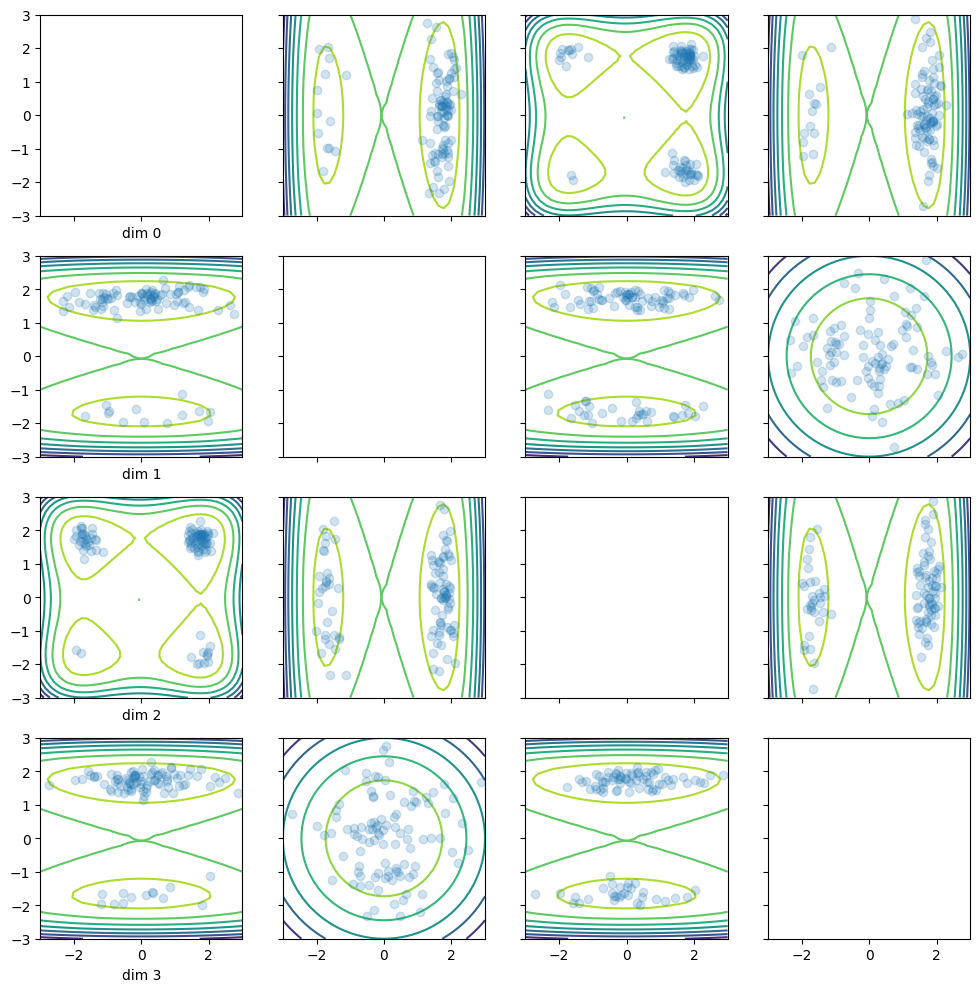

In [6]:
exp_config.seed = 0
exp_config.params_filename = f"checkpoint_seed{exp_config.seed}"
results0 = run_experiment(exp_config)

  0%|                                                   | 0/200 [00:00<?, ?it/s]

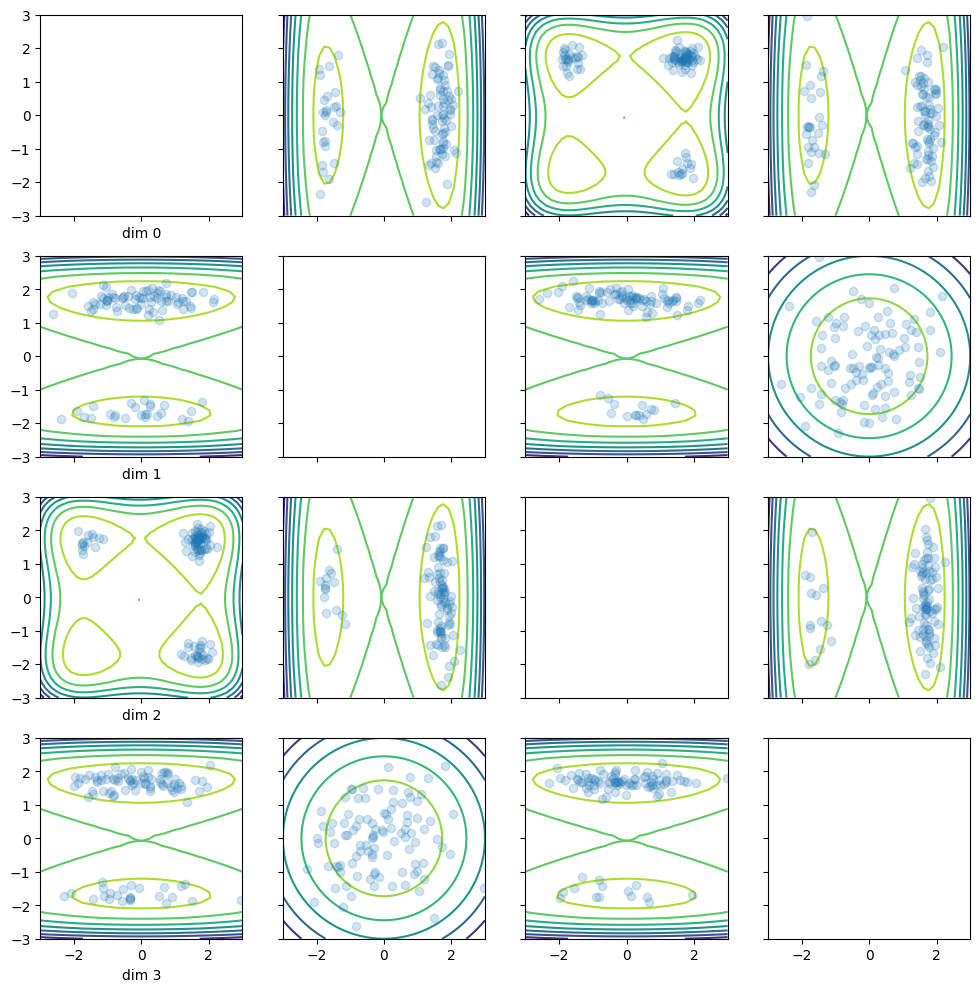

  0%|▏                                          | 1/200 [00:12<40:14, 12.13s/it]

effective sample size of 0.9999998807907104
Step 0: Free energy -157.56015014648438 Log Normalizer estimate 163.17323303222656


 16%|██████▉                                   | 33/200 [00:17<00:28,  5.85it/s]

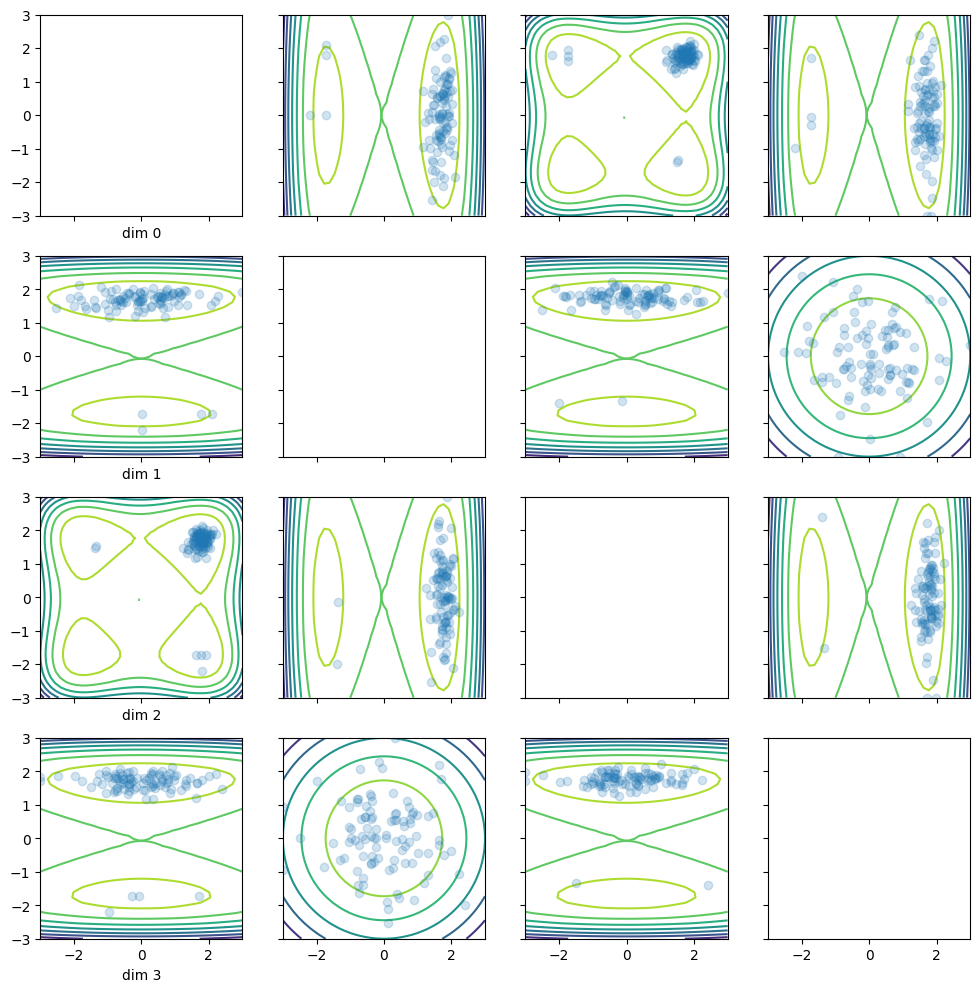

 17%|███████▏                                  | 34/200 [00:29<10:23,  3.76s/it]

effective sample size of 0.9999998807907104
Step 33: Free energy -162.53924560546875 Log Normalizer estimate 165.64837646484375


 33%|█████████████▊                            | 66/200 [00:35<00:22,  5.85it/s]

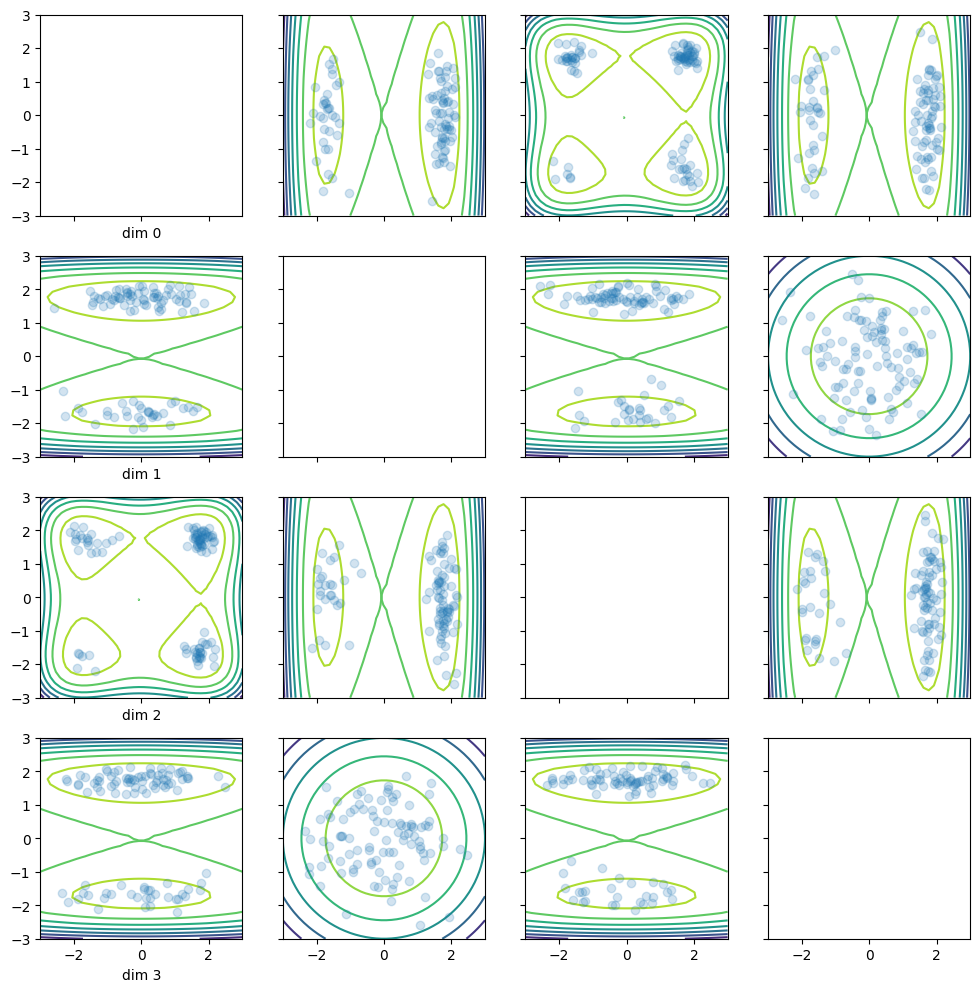

 34%|██████████████                            | 67/200 [00:47<08:22,  3.77s/it]

effective sample size of 0.7043033838272095
Step 66: Free energy -162.328369140625 Log Normalizer estimate 164.39466857910156


 50%|████████████████████▊                     | 99/200 [00:53<00:17,  5.85it/s]

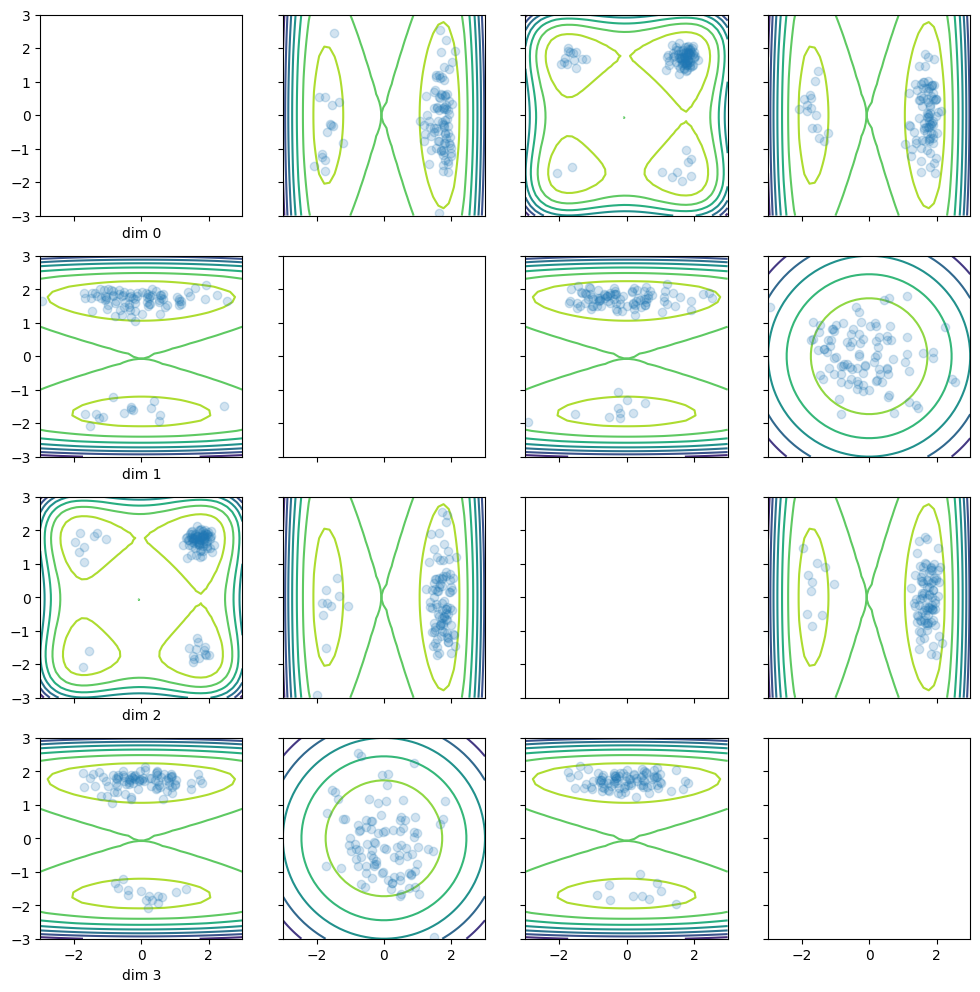

 50%|████████████████████▋                    | 101/200 [01:05<04:26,  2.70s/it]

effective sample size of 0.9999998807907104
Step 99: Free energy -162.95687866210938 Log Normalizer estimate 164.58291625976562


 66%|███████████████████████████              | 132/200 [01:10<00:11,  5.83it/s]

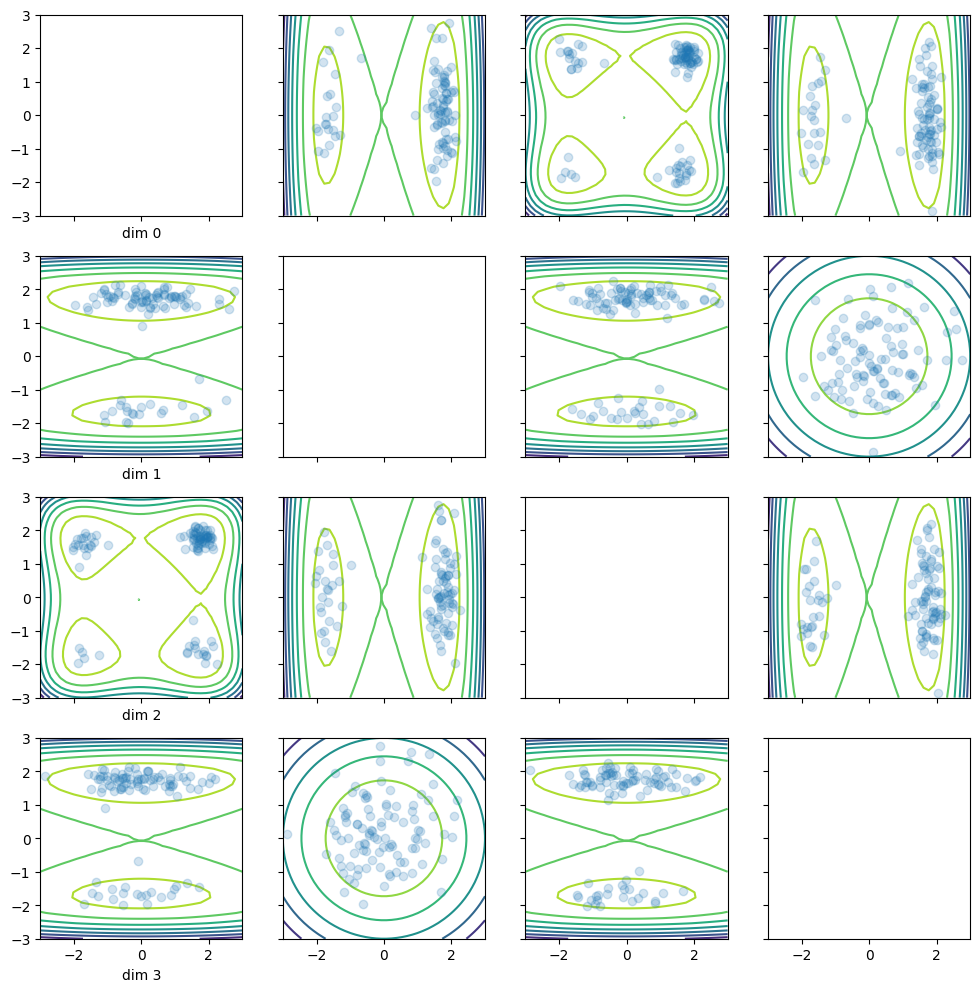

 66%|███████████████████████████▎             | 133/200 [01:23<04:15,  3.81s/it]

effective sample size of 0.45225587487220764
Step 132: Free energy -163.81642150878906 Log Normalizer estimate 165.216796875


 82%|█████████████████████████████████▊       | 165/200 [01:28<00:06,  5.76it/s]

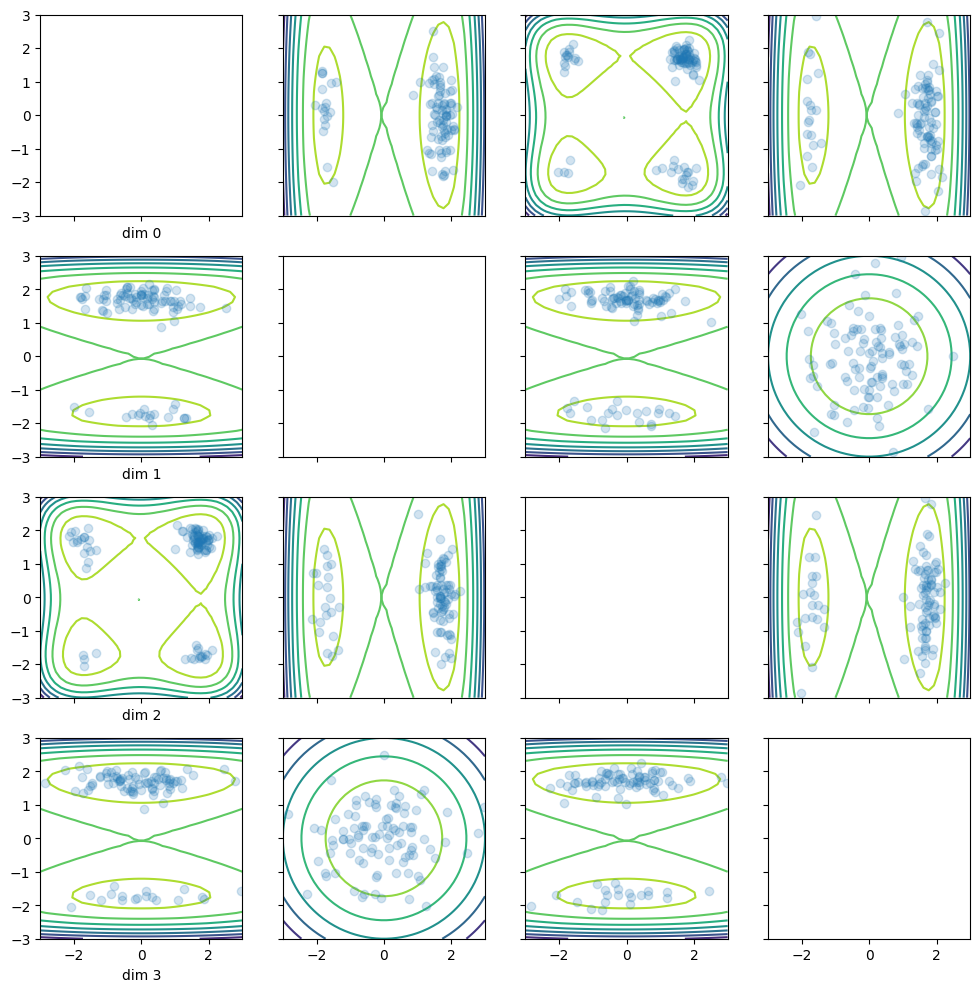

 83%|██████████████████████████████████       | 166/200 [01:40<02:10,  3.83s/it]

effective sample size of 0.9171335101127625
Step 165: Free energy -163.44656372070312 Log Normalizer estimate 164.55760192871094


 99%|████████████████████████████████████████▌| 198/200 [01:46<00:00,  5.85it/s]

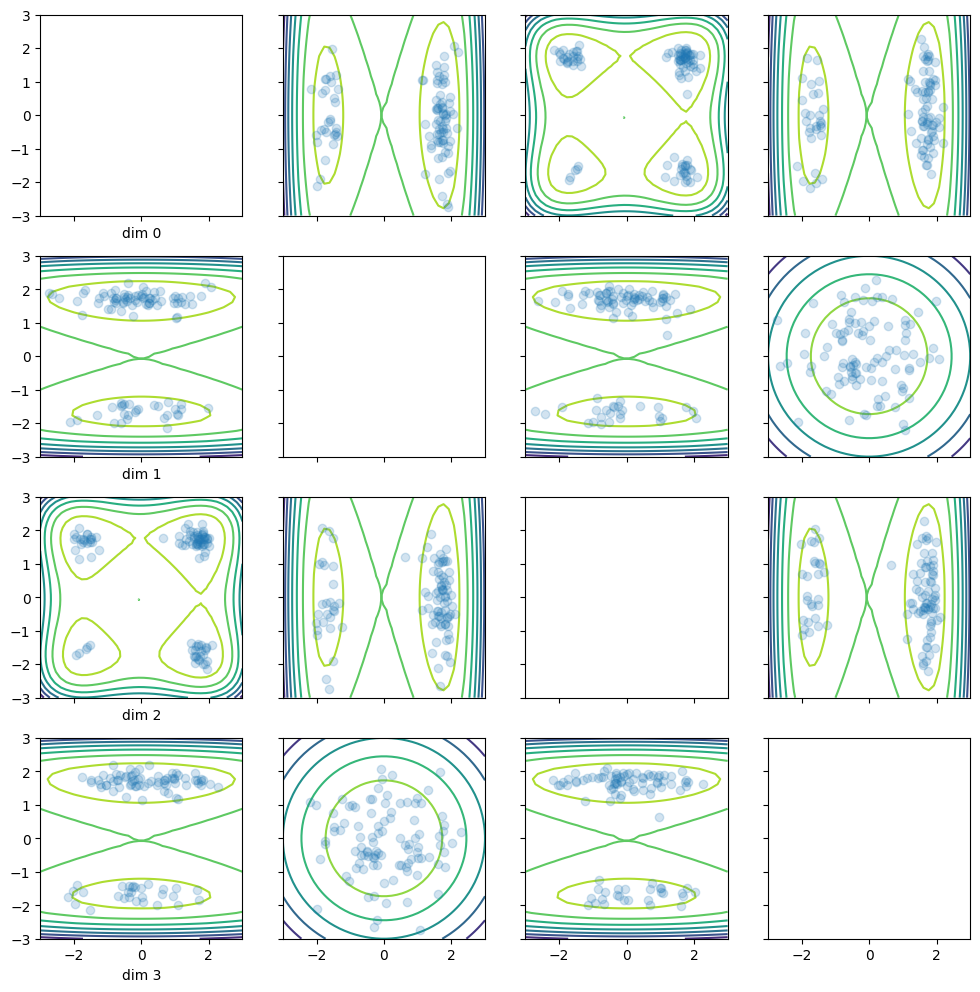

100%|████████████████████████████████████████▊| 199/200 [01:58<00:03,  3.74s/it]

effective sample size of 0.31531822681427
Step 198: Free energy -163.65670776367188 Log Normalizer estimate 164.71592712402344


100%|█████████████████████████████████████████| 200/200 [01:58<00:00,  1.68it/s]


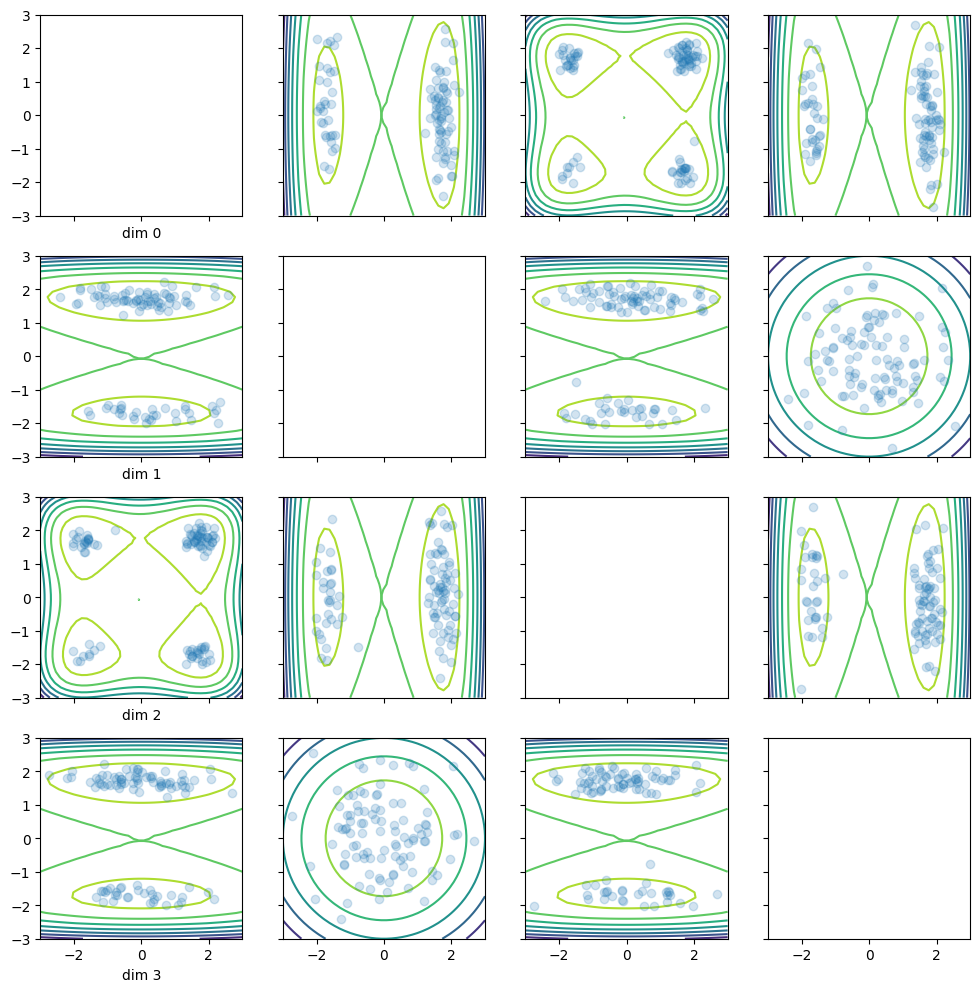

In [7]:
exp_config.seed = 1
exp_config.params_filename = f"checkpoint_seed{exp_config.seed}"
results1 = run_experiment(exp_config)

  0%|                                                   | 0/200 [00:00<?, ?it/s]

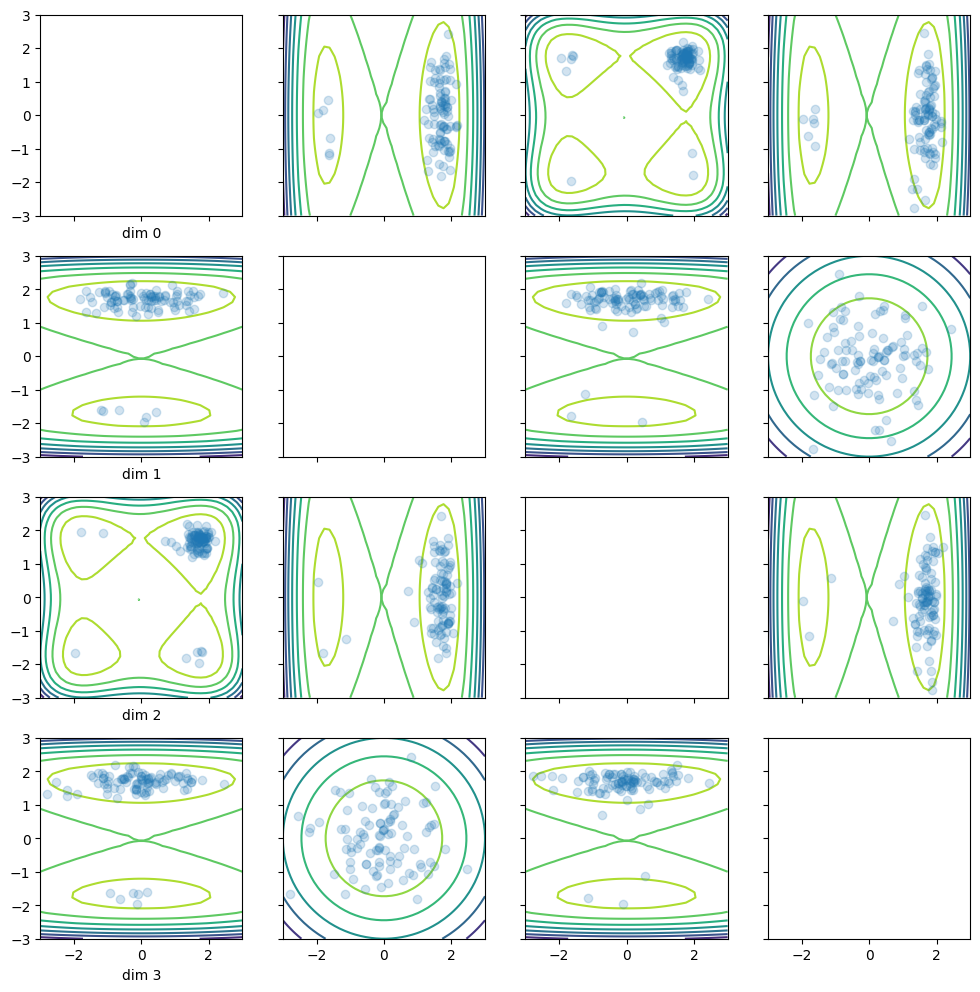

  1%|▍                                          | 2/200 [00:12<16:39,  5.05s/it]

effective sample size of 0.9999998807907104
Step 0: Free energy -157.8592529296875 Log Normalizer estimate 163.54441833496094


 16%|██████▉                                   | 33/200 [00:17<00:28,  5.89it/s]

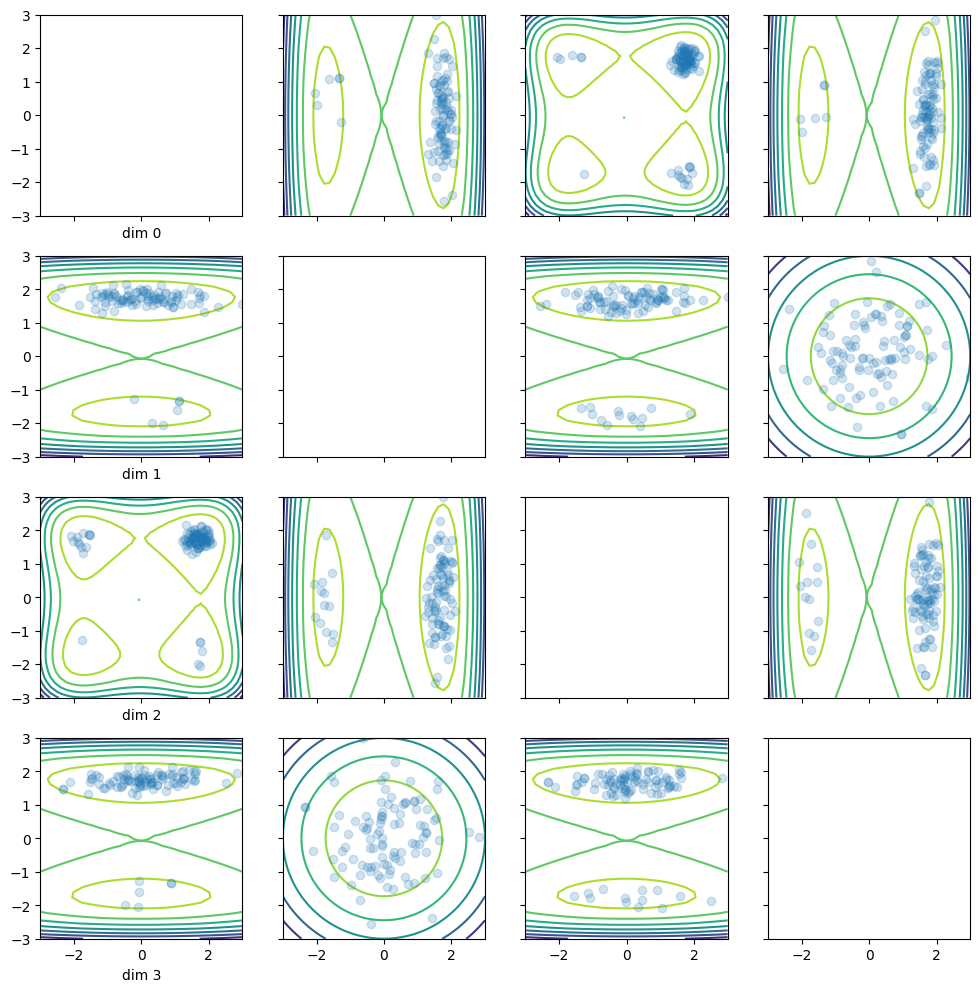

 17%|███████▏                                  | 34/200 [00:29<10:13,  3.70s/it]

effective sample size of 0.9999998807907104
Step 33: Free energy -162.16212463378906 Log Normalizer estimate 165.339111328125


 33%|█████████████▊                            | 66/200 [00:34<00:22,  5.90it/s]

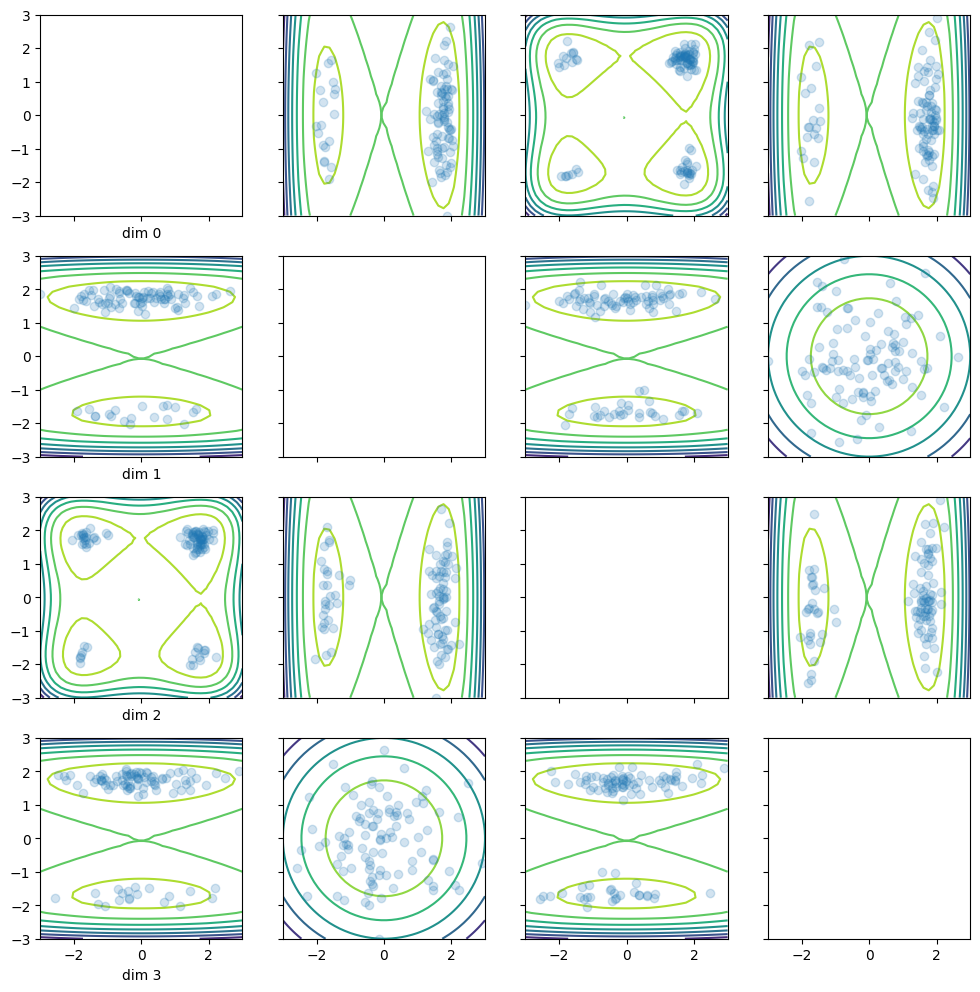

 34%|██████████████                            | 67/200 [00:46<08:13,  3.71s/it]

effective sample size of 0.7098571062088013
Step 66: Free energy -163.1783905029297 Log Normalizer estimate 165.2764129638672


 50%|████████████████████▊                     | 99/200 [00:52<00:17,  5.85it/s]

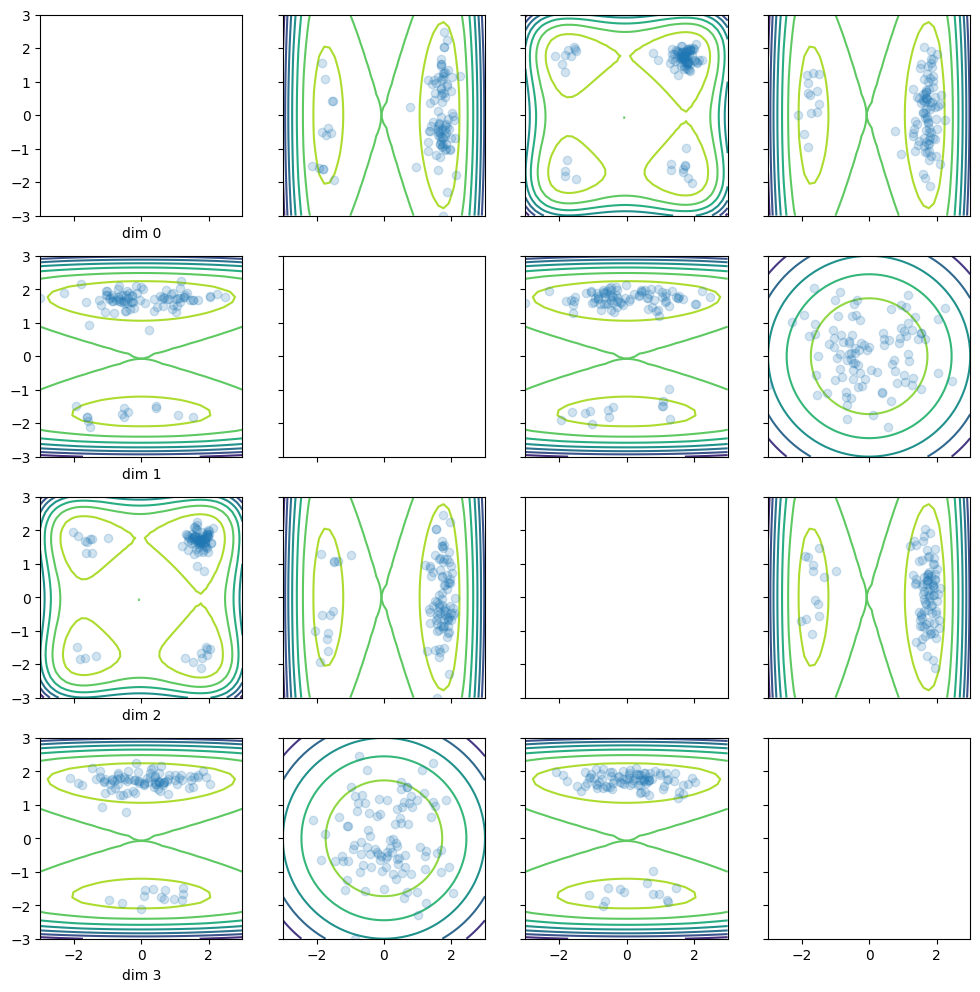

 50%|████████████████████▌                    | 100/200 [01:04<06:14,  3.75s/it]

effective sample size of 0.8895334601402283
Step 99: Free energy -163.24649047851562 Log Normalizer estimate 164.897705078125


 66%|███████████████████████████              | 132/200 [01:09<00:11,  5.86it/s]

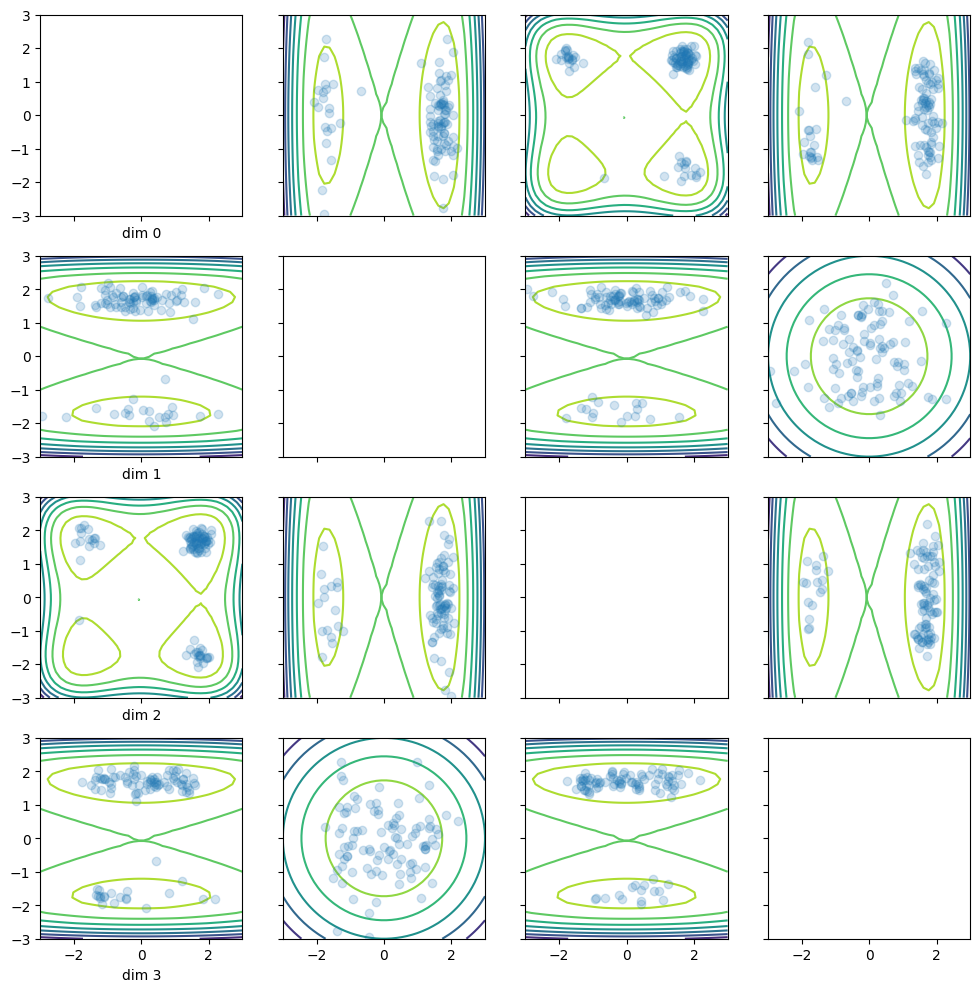

 66%|███████████████████████████▎             | 133/200 [01:22<04:12,  3.76s/it]

effective sample size of 0.6818336844444275
Step 132: Free energy -163.50057983398438 Log Normalizer estimate 164.84085083007812


 82%|█████████████████████████████████▊       | 165/200 [01:27<00:05,  5.85it/s]

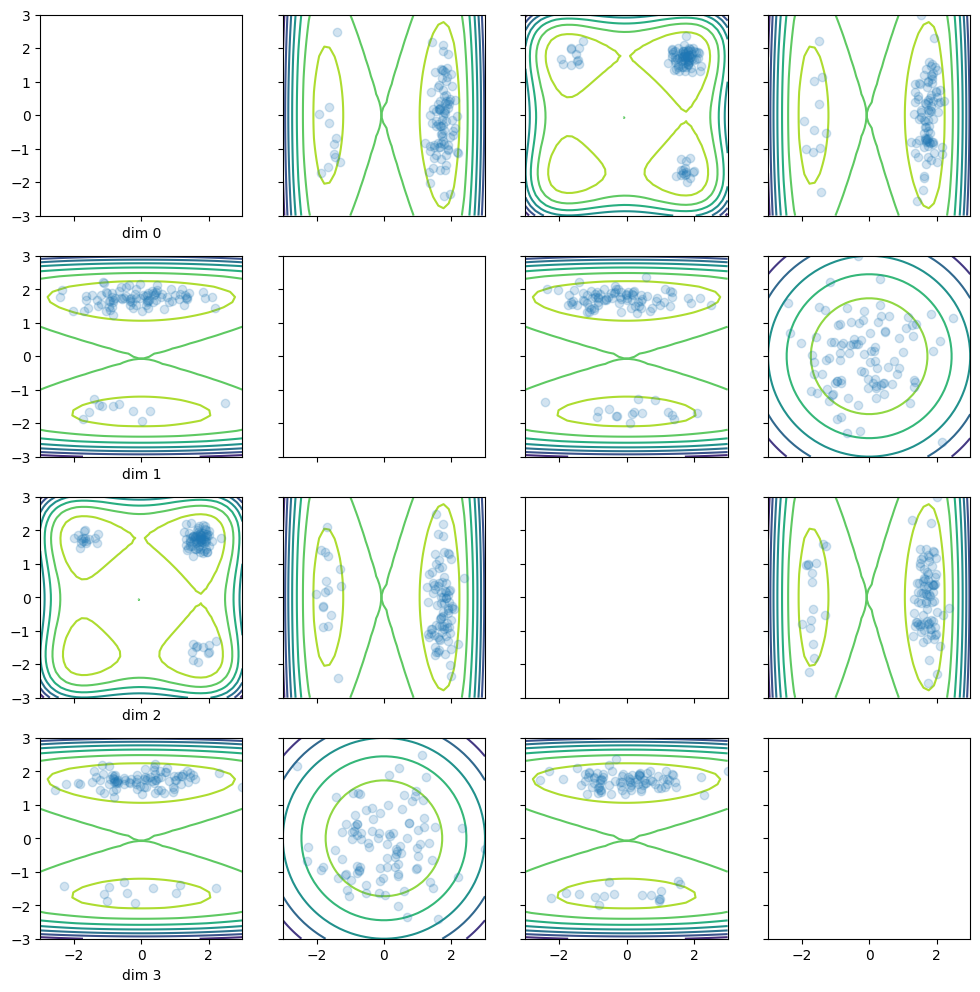

 83%|██████████████████████████████████       | 166/200 [01:39<02:08,  3.77s/it]

effective sample size of 0.9239829778671265
Step 165: Free energy -163.8864288330078 Log Normalizer estimate 165.05206298828125


 99%|████████████████████████████████████████▌| 198/200 [01:45<00:00,  5.85it/s]

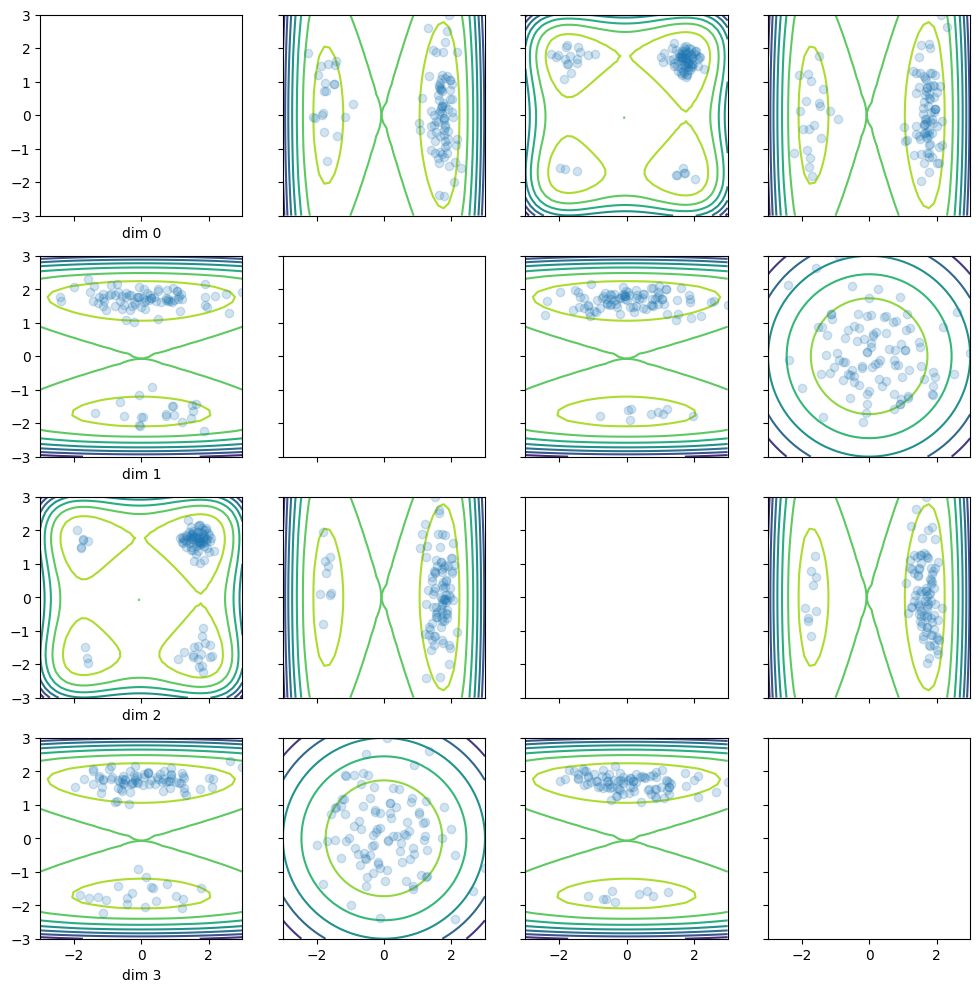

100%|████████████████████████████████████████▊| 199/200 [01:57<00:03,  3.78s/it]

effective sample size of 0.9164120554924011
Step 198: Free energy -163.5201416015625 Log Normalizer estimate 164.5655975341797


100%|█████████████████████████████████████████| 200/200 [01:57<00:00,  1.70it/s]


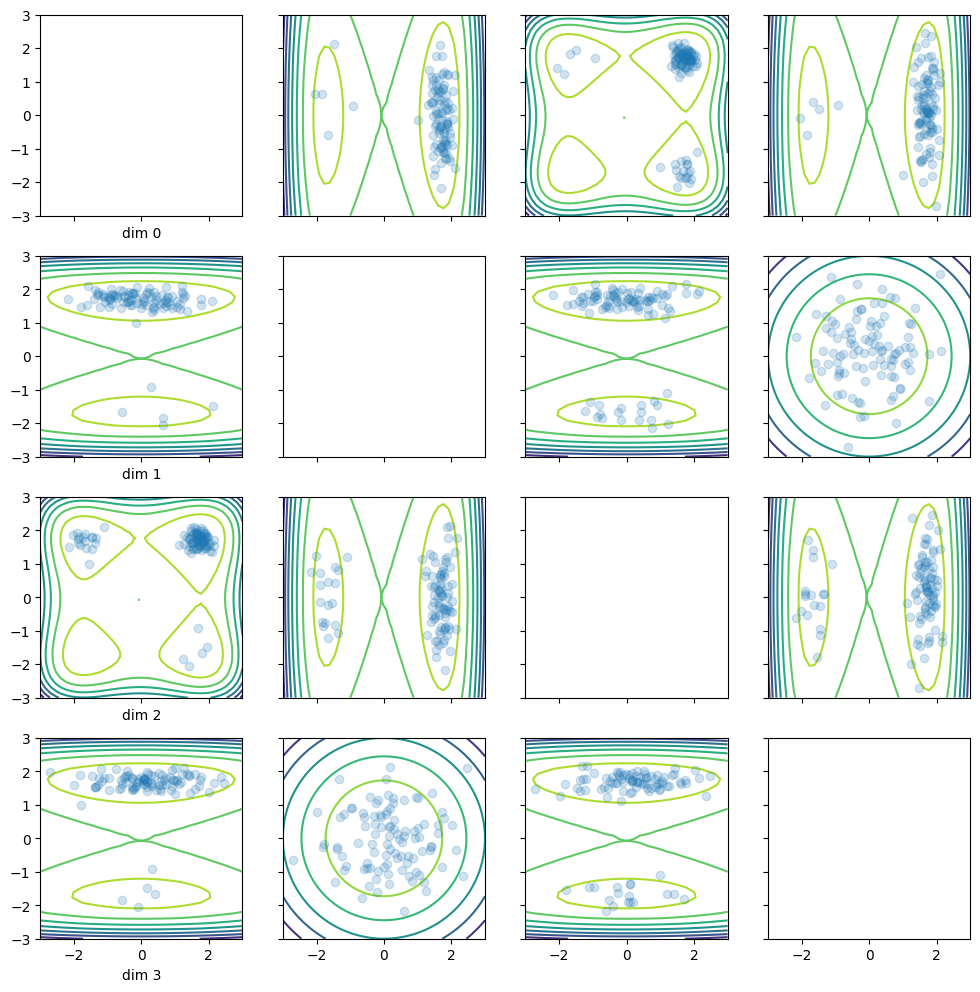

In [8]:
exp_config.seed = 2
exp_config.params_filename = f"checkpoint_seed{exp_config.seed}"
results1 = run_experiment(exp_config)

# Evaluation

In [52]:
# jax.config.update("jax_enable_x64", True)

In [55]:
from evaluation import evaluate_many_well, load_checkpoint, make_forward_pass_func, \
    make_get_ess, make_get_resample_info, get_flow_init_params

In [56]:
target_density = ManyWell(exp_config.final_config.density, (32,))

In [57]:
eval_batch_size = 1000

In [72]:
def evaluate_Z_estimation(seed):
    filename = f"checkpoint_seed{seed}"
    transition_params = load_checkpoint(filename)
    forward_pass_function = make_forward_pass_func(exp_config, transition_params=transition_params,
                                                  eval_batch_size=eval_batch_size)
    key = jax.random.PRNGKey(0)
    abs_errors = []
    for i in range(50):
        particle_state = forward_pass_function(subkey)
        log_Z_estimate = particle_state.log_normalizer_estimate
        relative_error = jnp.exp(log_Z_estimate - target_density.log_Z) - 1
        abs_error = jnp.abs(relative_error)
        abs_errors.append(abs_error)
    return jnp.stack(abs_errors)

In [ ]:
abs_errors0 = evaluate_Z_estimation(0)

In [65]:
abs_errors1 = evaluate_Z_estimation(1)

Array(0.22745085, dtype=float64)

In [ ]:
abs_errors2 = evaluate_Z_estimation(2)

In [81]:
jnp.mean(abs_errors0), jnp.mean(abs_errors1), jnp.mean(abs_errors2)

(Array(0.20232754, dtype=float64),
 Array(0.18046237, dtype=float64),
 Array(0.21211107, dtype=float64))

In [80]:
abs_errors0

Array([0.35491654, 0.67803333, 0.06048389, 0.20695873, 0.21395194,
       0.39957906, 0.08250399, 0.26250976, 0.09858704, 0.33317374,
       0.32167123, 0.08520659, 0.0217272 , 0.39084157, 0.05091572,
       0.44522862, 0.30476131, 0.10955959, 0.05682731, 0.08714859,
       0.3375759 , 0.30062812, 0.01047426, 0.16510846, 0.29187423,
       0.13328228, 0.03383596, 0.01793654, 0.66445516, 0.3118574 ,
       0.12318522, 0.02189466, 0.58509473, 0.11172092, 0.23805159,
       0.15733127, 0.10489019, 0.1153157 , 0.08986228, 0.23074789,
       0.12644156, 0.33344958, 0.11877089, 0.26418114, 0.33631895,
       0.27393093, 0.08356208, 0.35229149, 0.95860274, 0.16517976,
       0.14136932, 0.2038455 , 0.04308956, 0.01878835, 0.51738776,
       0.28519205, 0.16057794, 0.31296322, 0.18560209, 0.19083311,
       0.13235153, 0.09567553, 0.28270805, 0.02949008, 0.18421447,
       0.28108859, 0.01993565, 0.29788926, 0.34185972, 0.10399643,
       0.06663147, 0.40185792, 0.02182006, 0.32399002, 0.15204

### Evalation of full craft